# Modelisation approachs

## RFM clustering using K-Means* How are distributed the values ?

* How are distributed the values ?
* Scaling/Centering of the values

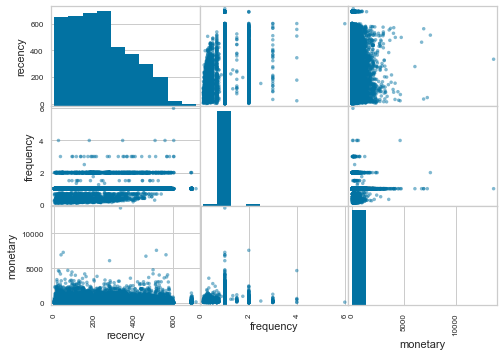

In [15]:
import pandas as pd

rfm = pd.read_csv('./../output/rfm.csv')

pd.plotting.scatter_matrix(rfm);

In [16]:
rfm.skew(numeric_only=True)

recency      0.447338
frequency    4.874460
monetary     9.212262
dtype: float64

In [17]:
rfm.describe()

,recency,frequency,monetary
count,93336.000000,93336.000000,93336.000000
mean,237.903853,1.004460,165.169348
std,152.552964,0.140078,226.313356
min,1.000000,0.095238,9.590000
25%,114.000000,1.000000,63.010000
50%,219.000000,1.000000,107.780000
75%,346.000000,1.000000,182.495000
max,714.000000,6.000000,13664.080000


In [18]:
from scipy.stats import boxcox


def transform_using_boxcox(x):
    xt, _ = boxcox(x)
    return xt


rfm_boxcox = rfm[["recency", "frequency", "monetary"]].apply(transform_using_boxcox, axis=0)

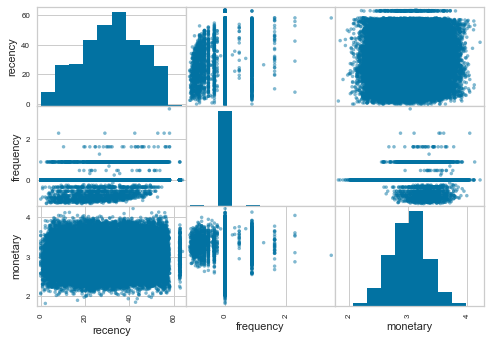

In [19]:
pd.plotting.scatter_matrix(rfm_boxcox);

Sadly, and as we may expect the distribution of the frequency is really skewed.

We will probably have poor performance from KMeans

In [20]:
from sklearn.preprocessing import StandardScaler

scaler = StandardScaler()
scaler.fit(rfm_boxcox)

scaled_customers = scaler.transform(rfm_boxcox)

In [21]:
from sklearn.cluster import KMeans

kmeans = KMeans(n_clusters=3)
kmeans.fit(scaled_customers)

clusters = kmeans.labels_

rfm['cluster'] = clusters
rfm.cluster = rfm.cluster.astype('category')

rfm

,customer_unique_id,recency,frequency,monetary,cluster
0,0000366f3b9a7992bf8c76cfdf3221e2,112.0,1.0,141.90,0
1,0000b849f77a49e4a4ce2b2a4ca5be3f,115.0,1.0,27.19,0
2,0000f46a3911fa3c0805444483337064,537.0,1.0,86.22,1
3,0000f6ccb0745a6a4b88665a16c9f078,321.0,1.0,43.62,1
4,0004aac84e0df4da2b147fca70cf8255,288.0,1.0,196.89,1
...,...,...,...,...,...
93331,fffcf5a5ff07b0908bd4e2dbc735a684,447.0,1.0,2067.42,1
93332,fffea47cd6d3cc0a88bd621562a9d061,262.0,1.0,84.58,1
93333,ffff371b4d645b6ecea244b27531430a,568.0,1.0,112.46,1
93334,ffff5962728ec6157033ef9805bacc48,119.0,1.0,133.69,0


Now, let's display our clusters :

In [22]:
import plotly.express as px
fig = px.scatter_3d(rfm, x='recency', y='monetary', z='frequency', color='cluster')
fig.show()

### Evaluation of the right number of clusters

How can we evaluate the right number of clusters ? We can use the elbow methods and the silhouette analysis.

#### Elbow Method

Elbow method gives us an idea on what a good _k_ number of clusters would be based on the sum of squared distance (SSE) between data points and their assigned clusters' centroids.

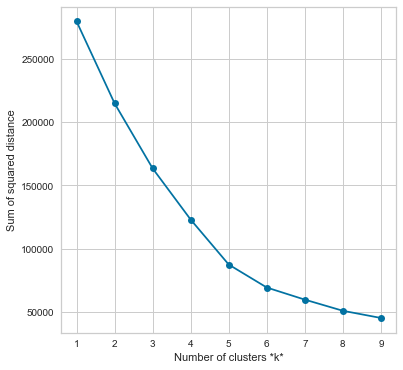

In [23]:
import matplotlib.pyplot as plt

# Run the Kmeans algorithm and get the index of data points clusters
sse = []
list_k = list(range(1, 10))

for k in list_k:
    km = KMeans(n_clusters=k)
    km.fit(scaled_customers)
    sse.append(km.inertia_)

# Plot sse against k
plt.figure(figsize=(6, 6))
plt.plot(list_k, sse, '-o')
plt.xlabel(r'Number of clusters *k*')
plt.ylabel('Sum of squared distance');

The graph above shows that `k = 5` is a goof choice. Sometimes it’s still hard to figure out a good number of clusters to use because the curve is monotonically decreasing and may not show any elbow or has an obvious point where the curve starts flattening out.

#### Silhouette Analysis

The **silhouette** analysis is used to evaluate the degree of separation between the clusters.
What we want is all points of a cluster as close as possible and the distance between the clusters as big as possible !

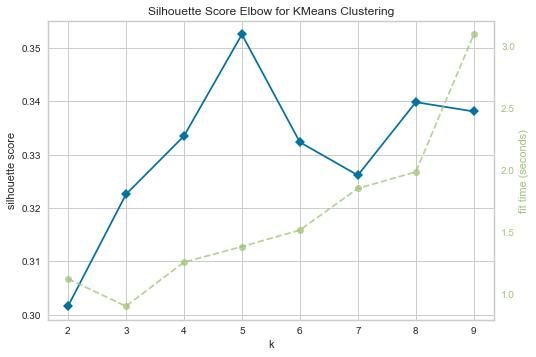

<AxesSubplot:title={'center':'Silhouette Score Elbow for KMeans Clustering'}, xlabel='k', ylabel='silhouette score'>

In [25]:
from yellowbrick.cluster import KElbowVisualizer

kmeans = KMeans()
visualizer = KElbowVisualizer(kmeans, k=(2,10), metric='silhouette', locate_elbow=False)
# Fit the data and visualize
visualizer.fit(scaled_customers)
visualizer.show();

From the silhouette score, it confirms that `k = 5` is an optimal choice, let's see how behave the clusters visually :

In [27]:
kmeans = KMeans(n_clusters=5)
kmeans.fit(scaled_customers)

clusters = kmeans.labels_

rfm['cluster'] = clusters
rfm.cluster = rfm.cluster.astype('category')

fig = px.scatter_3d(rfm, x='recency', y='monetary', z='frequency', color='cluster', opacity=0.7)
fig.show()

In [ ]:
print('Done')